In [1]:
import shap
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import math
from sentence_transformers import SentenceTransformer
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from imblearn.over_sampling import SMOTE
from lime.lime_text import LimeTextExplainer

random.seed(42)

In [2]:
# Load SBERT model for feature extraction
sbert_model = SentenceTransformer('all-MiniLM-L12-v2')  # Fast and effective sentence transformer model

# Define file paths for training and test data
train_path = "PreProcessingResumes/processed_data/Resume/train.csv"
test_path = "PreProcessingResumes/processed_data/Resume/test.csv"

# Load datasets
train_df = pd.read_csv(train_path)
test_df = pd.read_csv(test_path)

# Initialize and fit label encoder on training labels
encoder = LabelEncoder()
encoder.fit(train_df['Category'])

# Extract resume texts and corresponding encoded labels for training
X_train = train_df['Resume_str'].tolist()
y_train = encoder.transform(train_df['Category'])

# Extract resume texts and corresponding encoded labels for testing
X_test = test_df['Resume_str'].tolist()
y_test = encoder.transform(test_df['Category'])

# Generate sentence embeddings using SBERT for training and test data
X_train_emb = sbert_model.encode(X_train, convert_to_numpy=True, show_progress_bar=True)
X_test_emb = sbert_model.encode(X_test, convert_to_numpy=True, show_progress_bar=True)

Batches:   0%|          | 0/63 [00:00<?, ?it/s]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

In [3]:
class_counts = train_df['Category'].value_counts()
min_classes = class_counts[class_counts < 0.75*class_counts.mean()].index.tolist()

print(f"Applying SMOTE to classes: {min_classes}")

target_size = int(0.75*class_counts.max())

min_classes_encoded = encoder.transform(min_classes)
sampling_strategy = {label: target_size for label in min_classes_encoded}

Applying SMOTE to classes: ['ADVOCATE', 'APPAREL', 'BPO', 'AGRICULTURE', 'ARTS', 'AUTOMOBILE']


In [4]:
smote = SMOTE(sampling_strategy=sampling_strategy, random_state=42, k_neighbors=4)
X_train_emb_bal, y_train_bal = smote.fit_resample(X_train_emb, y_train)

clf = SVC(probability=True, random_state=42, C=1, kernel="linear")
clf.fit(X_train_emb_bal, y_train_bal)

SVC(C=1, kernel='linear', probability=True, random_state=42)

### Explainable AI

In [5]:
def predict_proba_text(texts):
    embeds = sbert_model.encode(texts, convert_to_numpy=True)
    return clf.predict_proba(embeds)

In [6]:
# Create a text masker for SHAP
masker = shap.maskers.Text()

# Initialize the SHAP explainer with your prediction function and output class names
shap_explainer = shap.Explainer(predict_proba_text, masker, output_names=encoder.classes_.tolist())

# Select a random index from the test set
idx = random.randint(0, len(X_test) - 1)
sample_text = X_test[idx]

# Predict class probabilities for the selected sample
probs = predict_proba_text([sample_text])[0]

predicted_class = encoder.classes_[probs.argmax()]          # Get the predicted class

print(f"CV ID: {idx}")
print(f"Predicted class: {predicted_class}")

shap_values = shap_explainer([sample_text])                 # Compute SHAP values for the selected sample

shap.plots.text(shap_values[0])

CV ID: 327
Predicted class: APPAREL


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:22, 22.23s/it]               


In [7]:
def get_one_sample_per_class(X_test, y_test, encoder):
    samples = []
    for target_class_name in encoder.classes_:
        # Convert class name to its numeric label
        class_index = encoder.transform([target_class_name])[0]
        
        # Find all indices in y_test matching this class
        indices_for_class = [i for i, label in enumerate(y_test) if label == class_index]
        
        # Choose one index at random
        sample_idx = random.choice(indices_for_class)
        sample_text = X_test[sample_idx]
        
        # Store the class name, index, and text
        samples.append((target_class_name, sample_idx, sample_text))
    
    return samples

Class: ACCOUNTANT, Sample Index: 121
Class: ADVOCATE, Sample Index: 389
Class: AGRICULTURE, Sample Index: 118
Class: APPAREL, Sample Index: 327
Class: ARTS, Sample Index: 453
Class: AUTOMOBILE, Sample Index: 200
Class: AVIATION, Sample Index: 429
Class: BANKING, Sample Index: 384
Class: BPO, Sample Index: 494
Class: BUSINESS-DEVELOPMENT, Sample Index: 252
Class: CHEF, Sample Index: 341
Class: CONSTRUCTION, Sample Index: 482
Class: CONSULTANT, Sample Index: 95
Class: DESIGNER, Sample Index: 277
Class: DIGITAL-MEDIA, Sample Index: 370
Class: ENGINEERING, Sample Index: 89
Class: FINANCE, Sample Index: 7
Class: FITNESS, Sample Index: 393
Class: HEALTHCARE, Sample Index: 237
Class: HR, Sample Index: 187
Class: INFORMATION-TECHNOLOGY, Sample Index: 363
Class: PUBLIC-RELATIONS, Sample Index: 100
Class: SALES, Sample Index: 490
Class: TEACHER, Sample Index: 208


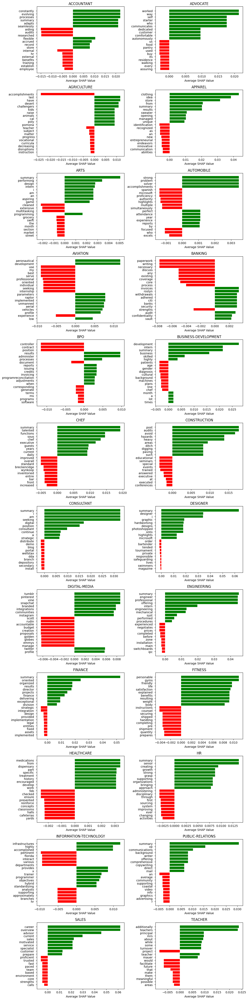

In [8]:
# Create a SHAP explainer using your model and a text masker
explainer = shap.Explainer(predict_proba_text, shap.maskers.Text())

# Get one sample per class as before
samples = get_one_sample_per_class(X_test, y_test, encoder)

# Prepare subplots
num_classes = len(samples)
n_cols = 2
n_rows = math.ceil(num_classes / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))
axes = axes.flatten()

# Loop through each sampled CV and plot aggregated SHAP impacts
for idx, (class_name, sample_idx, sample_text) in enumerate(samples):
    print(f"Class: {class_name}, Sample Index: {sample_idx}")
    
    # Compute SHAP values for this text sample
    shap_values = explainer([sample_text], silent=True)
    
    # Aggregate SHAP values by word/token
    word_scores = defaultdict(list)
    for explanation in shap_values:
        tokens = explanation.data                    
        values = explanation.values[:, encoder.transform([class_name])[0]]
        for token, val in zip(tokens, values):
            word_scores[token].append(val)
    
    # Compute average impact per word
    avg_word_impact = {w: np.mean(vals) for w, vals in word_scores.items()}
    
    # Top positive and negative contributors
    top_pos = sorted(avg_word_impact.items(), key=lambda x: x[1], reverse=True)[:10]
    top_neg = sorted(avg_word_impact.items(), key=lambda x: x[1])[:10]
    combined = top_pos + top_neg
    sorted_by_abs = sorted(combined, key=lambda x: abs(x[1]), reverse=True)
    
    # Prepare bar chart data
    words, scores = zip(*sorted_by_abs)
    colors = ['green' if s > 0 else 'red' for s in scores]
    
    # Plot horizontal bar chart
    ax = axes[idx]
    ax.barh(words, scores, color=colors)
    ax.set_xlabel("Average SHAP Value")
    ax.set_title(f"{class_name}")
    ax.invert_yaxis()  # highest-impact at top

# Remove any unused axes
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

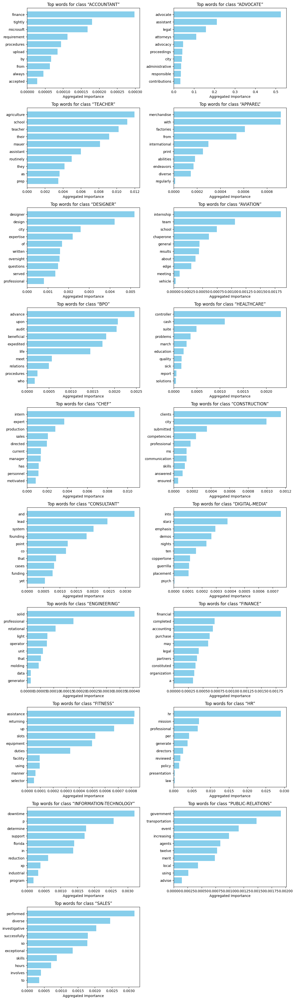

In [9]:
# Prepare subplots
num_classes = len(samples)
n_cols = 2
n_rows = math.ceil(num_classes / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 4))
axes = axes.flatten()

# Initialize LIME text explainer with class names
lime_explainer = LimeTextExplainer(class_names=encoder.classes_)

# Dictionary to accumulate absolute weights per class and word
class_weights = defaultdict(lambda: defaultdict(float))

# Explain each sampled instance
for class_name, sample_idx, sample_text in samples:
    # Generate LIME explanation for this single instance
    exp = lime_explainer.explain_instance(
        sample_text,
        predict_proba_text,
        num_features=10,    # top 10 features per explanation
        num_samples=200     # number of perturbed samples
    )
    
    # Determine predicted class label (should match class_name)
    probs = predict_proba_text([sample_text])[0]
    pred = encoder.classes_[np.argmax(probs)]
    
    # Accumulate absolute feature weights for the predicted class
    for word, weight in exp.as_list():
        class_weights[pred][word] += abs(weight)

# Plot top aggregated words for each class on the subplots
for idx, (cls, weights_dict) in enumerate(class_weights.items()):
    # Select top 10 words by aggregated importance
    top = sorted(weights_dict.items(), key=lambda x: x[1], reverse=True)[:10]
    words, weights = zip(*top)
    
    ax = axes[idx]
    # horizontal barplot on the shared axes
    ax.barh(words, weights, color="skyblue")
    ax.set_title(f"Top words for class “{cls}”")
    ax.set_xlabel("Aggregated Importance")
    ax.invert_yaxis()  # highest-impact at top

# Remove any unused axes
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()